## Creating an Economic Analysis of the Leschi Lid!

### Notes

Parcel Dataset - https://gis-kingcounty.opendata.arcgis.com/datasets/kingcounty::parcels-for-king-county-with-address-with-property-information-parcel-address-area/explore?location=47.426209%2C-121.817400%2C9.74&showTable=true

Redlining Map - https://dsl.richmond.edu/panorama/redlining/map/WA/Seattle/area_descriptions#loc=13/47.6113/-122.323

Tunnel Dataset --> https://gisdata-wsdot.opendata.arcgis.com/datasets/8a0b7336c568428faed36a67beae8075_13/explore?location=47.605211%2C-122.227590%2C11.87

Property Tax Dataset --> https://data.kingcounty.gov/Property-Assessments/Real-Property-Tax-Receivables/dkna-i698/about_data


In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib as plt
import matplotlib.pyplot as pyplot

import h3pandas

pd.set_option('display.max_columns', None) ### This line makes all the columns display, rather than ellipses shorten

In [2]:
parcel_data_frame = gpd.read_file("C:/Users/aaron/Fun Mapping Work/Data/Parcels_for_King_County_with_Address_with_Property_Information___parcel_address_area")

In [3]:
tunnels_data_frame = gpd.read_file("C:/Users/aaron/Fun Mapping Work/Data/WSDOT_-_Roadway_Data_Tunnels")

In [4]:
#tunnels_data_frame.head()

In [5]:
##Whittle down the tunnel data set to only include leschi

tunnel_data_frame_masked = tunnels_data_frame[(tunnels_data_frame['RouteIdent'] == "090d") | (tunnels_data_frame['RouteIdent'] == "090i")]

tunnel_data_frame_masked = tunnel_data_frame_masked[(tunnel_data_frame_masked['Structur_1'] == "MT BAKER RIDGE") | (tunnel_data_frame_masked['Structur_1'] == "MARTIN LUTHER KING LID")]#

In [6]:
tunnel_data_frame_masked.explore()

In [7]:
tunnel_data_frame_masked

,OBJECTID,RouteIdent,BeginAccum,EndAccumul,BeginState,BeginAhead,EndStateRo,EndAheadBa,StructureN,StructureI,Structur_1,LRSDate,SnapshotDa,TunnelLeng,SHAPESTLen,geometry
10,11,090i,2.00,2.28,3.94,A,4.22,A,090024S,000000KM,MT BAKER RIDGE,2023-12-31,2024-02-05,0.28,1358.806332,"LINESTRING (-13613708.991 6038928.117, -136130..."
12,13,090d,1.63,2.00,3.57,A,3.94,A,090022LID,0013105A,MARTIN LUTHER KING LID,2023-12-31,2024-02-05,0.37,2081.562793,"LINESTRING (-13614650.096 6039000.266, -136137..."
28,29,090i,1.63,2.00,3.57,A,3.94,A,090022LID,0013105A,MARTIN LUTHER KING LID,2023-12-31,2024-02-05,0.37,2092.878208,"LINESTRING (-13614652.797 6038921.025, -136139..."
67,68,090d,2.00,2.28,3.94,A,4.22,A,090024N,0013105B,MT BAKER RIDGE,2023-12-31,2024-02-05,0.28,1349.146655,"LINESTRING (-13613711.145 6038995.654, -136131..."


In [8]:
#parcel_data_frame.info()

In [9]:
## calculate total tax (appraised + improved)

parcel_data_frame['total_tax'] = parcel_data_frame['APPRLNDVAL'] + parcel_data_frame['APPR_IMPR']

In [10]:
## calculate total tax per sqft

parcel_data_frame['total_tax_per_sqft'] = parcel_data_frame['total_tax'] / parcel_data_frame['LOTSQFT']

In [11]:
parcel_data_frame.head()

,OBJECTID,MAJOR,MINOR,PIN,COMMENTS,SITETYPE,SITEID,ADDR_HN,ADDR_PD,ADDR_PT,ADDR_SN,ADDR_ST,ADDR_SD,ADDR_NUM,ADDR_FULL,FULLNAME,ZIP5,PLUS4,CTYNAME,POSTALCTYN,LAT,LON,POINT_X,POINT_Y,COUNTY,KROLL,KCTP_CITY,KCTP_STATE,PLSS,PROP_NAME,PLAT_NAME,PLAT_LOT,PLAT_BLOCK,LOTSQFT,LEVYCODE,LEVY_JURIS,NEW_CONSTR,TAXVAL_RSN,APPRLNDVAL,APPR_IMPR,TAX_LNDVAL,TAX_IMPR,ACCNT_NUM,KCTP_TAXYR,UNIT_NUM,BLDG_NUM,CONDOSITUS,QTS,SEC,TWP,RNG,PRIMARY_AD,ANNEXING_C,PAAUNIQUEN,PROPTYPE,ALIAS1,ALIAS2,KCA_ZONING,KCA_ACRES,LEGALDESC,PREUSE_COD,PREUSE_DES,Shape_Leng,Shape_Area,geometry,total_tax,total_tax_per_sqft
0,1,990600,0100,9906000100,None,R1,{A6FE4FE7-F594-4279-8DE4-AEEEA70425B5},119,NW,None,41ST,ST,None,119,119 NW 41ST ST,NW 41ST ST,98107,4928,Seattle,SEATTLE,47.656112,-122.358054,1.264674e+06,243051.697093,KING,21,SEATTLE,WA,NE13-25-3,None,ZWICKS 1ST ADD,4,2,4400.0,0010,SEATTLE,N,None,659000.0,244000.0,659000.0,244000.0,990600010005,2023.0,None,None,None,NE,13,25,3,1,None,None,R,None,None,NR3,0.101010,ZWICKS 1ST ADD W 40 FT,2.0,Single Family(Res Use/Zone),297.528111,4245.712203,"POLYGON ((1264694.731 243106.485, 1264692.029 ...",903000.0,205.227273
1,2,990600,0090,9906000090,None,R1,{C02EB04E-58D3-4C9B-83CE-D4BBDDF8A72C},115,NW,None,41ST,ST,None,115,115 NW 41ST ST,NW 41ST ST,98107,4928,Seattle,SEATTLE,47.656112,-122.357895,1.264713e+06,243051.033052,KING,21,SEATTLE,WA,NE13-25-3,None,ZWICKS 1ST ADD,3-4,2,4404.0,0010,SEATTLE,N,None,698000.0,207000.0,698000.0,207000.0,990600009007,2023.0,None,None,None,NE,13,25,3,1,None,None,R,None,None,NR3,0.101102,ZWICKS 1ST ADD W 23.41 FT O...,2.0,Single Family(Res Use/Zone),300.650731,4417.452866,"POLYGON ((1264694.731 243106.485, 1264711.389 ...",905000.0,205.495005
2,3,990600,0080,9906000080,None,R1,{7E515CEF-6A98-42A8-AE42-4A0382F3D089},111,NW,None,41ST,ST,None,111,111 NW 41ST ST,NW 41ST ST,98107,4928,Seattle,SEATTLE,47.656112,-122.357733,1.264753e+06,243050.356872,KING,21,SEATTLE,WA,NE13-25-3,None,ZWICKS 1ST ADD,2-3,2,4400.0,0010,SEATTLE,N,None,698000.0,255000.0,698000.0,255000.0,990600008009,2023.0,None,None,None,NE,13,25,3,1,None,None,R,None,None,NR3,0.101010,ZWICKS 1ST ADD W 13.41 FT O...,2.0,Single Family(Res Use/Zone),300.522770,4409.980644,"POLYGON ((1264774.781 243105.137, 1264773.008 ...",953000.0,216.590909
3,4,990600,0065,9906000065,None,R1,{46A6992D-BFC2-4469-8EB8-3D51EE025941},4015,None,None,1ST,AVE,NW,4015,4015 1ST AVE NW,1ST AVE NW,98107,4908,Seattle,SEATTLE,47.656014,-122.357477,1.264816e+06,243013.160096,KING,21,SEATTLE,WA,NE13-25-3,None,ZWICKS 1ST ADD,1-2,2,3290.0,0010,SEATTLE,N,None,583000.0,190000.0,583000.0,190000.0,990600006508,2023.0,None,None,None,NE,13,25,3,1,None,None,R,None,None,NR3,0.075528,ZWICKS 1ST ADD S 38 FT OF 1...,2.0,Single Family(Res Use/Zone),249.175827,3290.316960,"POLYGON ((1264859.583 243031.421, 1264858.65 2...",773000.0,234.954407
4,5,990600,0060,9906000060,None,R1,{8ABFC012-D27B-468E-8C10-6587980B7DA8},4017,None,None,1ST,AVE,NW,4017,4017 1ST AVE NW,1ST AVE NW,98107,4908,Seattle,SEATTLE,47.656116,-122.357474,1.264817e+06,243050.573079,KING,21,SEATTLE,WA,NE13-25-3,None,ZWICKS 1ST ADD,1-2,2,6234.0,0010,SEATTLE,N,None,776000.0,96000.0,776000.0,96000.0,990600006003,2023.0,None,None,None,NE,13,25,3,1,None,None,R,None,None,NR3,0.143113,ZWICKS 1ST ADD N 72 FT OF 1...,2.0,Single Family(Res Use/Zone),317.712387,6257.447126,"POLYGON ((1264859.583 243031.421, 1264809.594 ...",872000.0,139.878088


In [12]:
tax_tooltip = {'ADDR_FULL', 'PROP_NAME', 'LOTSQFT','APPRLNDVAL','APPR_IMPR', 'total_tax_per_sqft'}

In [13]:
interactive_map = parcel_data_frame.explore()

In [14]:
##Mask for Leschi area

Leschi_Approximation = parcel_data_frame[(parcel_data_frame['LAT'] >= 47.58) & (parcel_data_frame['LAT'] <= 47.60) & (parcel_data_frame['LON'] >= -122.305)]

In [15]:
#interactive_map.plot()

In [16]:
#parcel_data_frame.plot()

<Axes: >

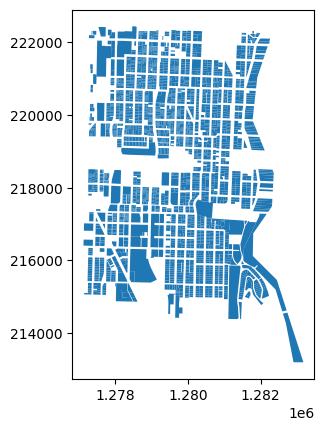

In [17]:
Leschi_Approximation.plot()

In [23]:
Leschi_Approximation.explore(column = 'total_tax_per_sqft', tooltip = tax_tooltip, cmap = 'PuOr')

## Attempt at using LOG scale
#Leschi_Approximation.explore(column = 'total_tax_per_sqft', tooltip = tax_tooltip, norm=plt.colors.LogNorm(vmin=0, vmax=4000))



In [ ]:
Leschi_Approximation.head()

In [ ]:
total_area_tax = Leschi_Approximation['total_tax'].sum()

total_area_tax

In [ ]:
#### Calculate the distance from I90 in the Leschi Approximation data set

